In [1]:
import sys
sys.path.insert(0, "/home/pwahle/microglia/")

import yaml
import importlib
import modules
importlib.reload(modules)
import os
from pathlib import Path
import subprocess

# load global variables and parameters
with open("../params.yml", 'r') as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)

globals().update(cfg)
r_path = str(Path('/usr/local/R-4.0.3/bin/Rscript'))  # path to r interpreter

from scipy import ndimage
import re
import cv2
from scipy import ndimage as ndi
import copy
import numpy as np
import matplotlib as mpl
import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io
import nd2
from nd2reader import ND2Reader

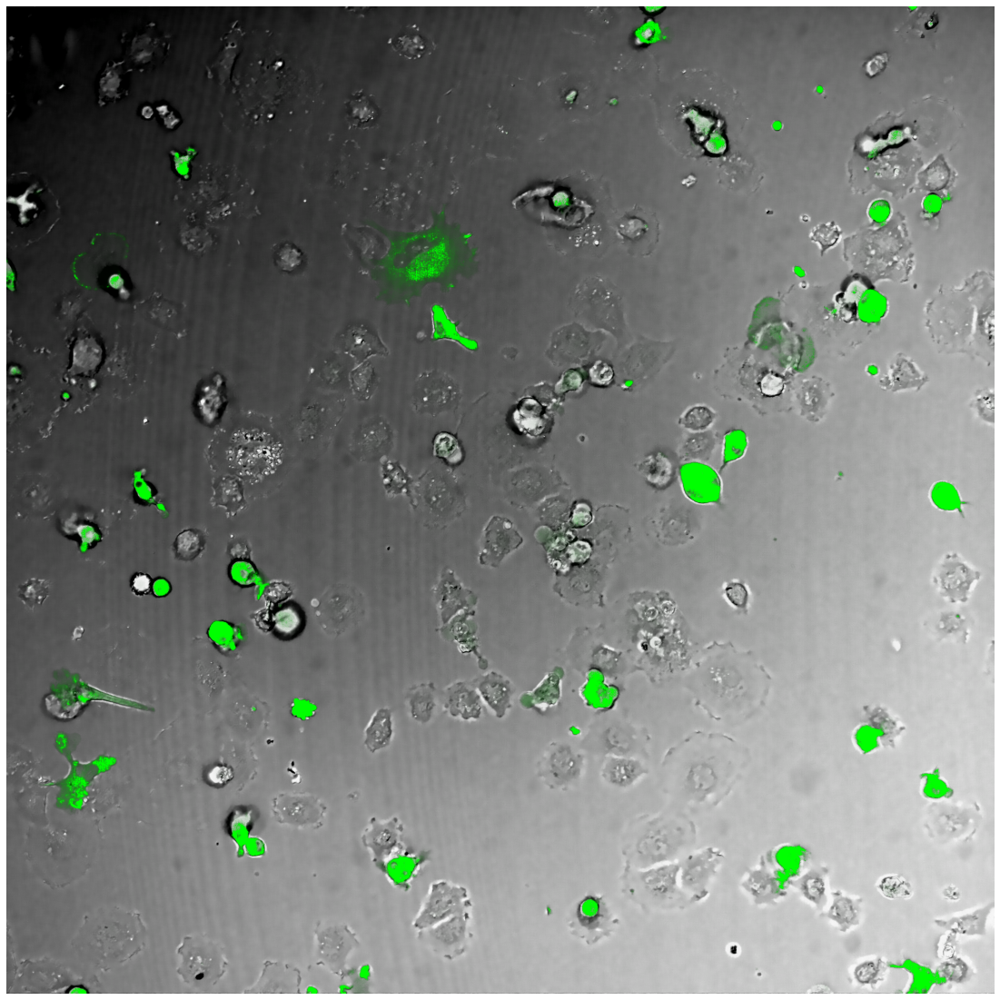

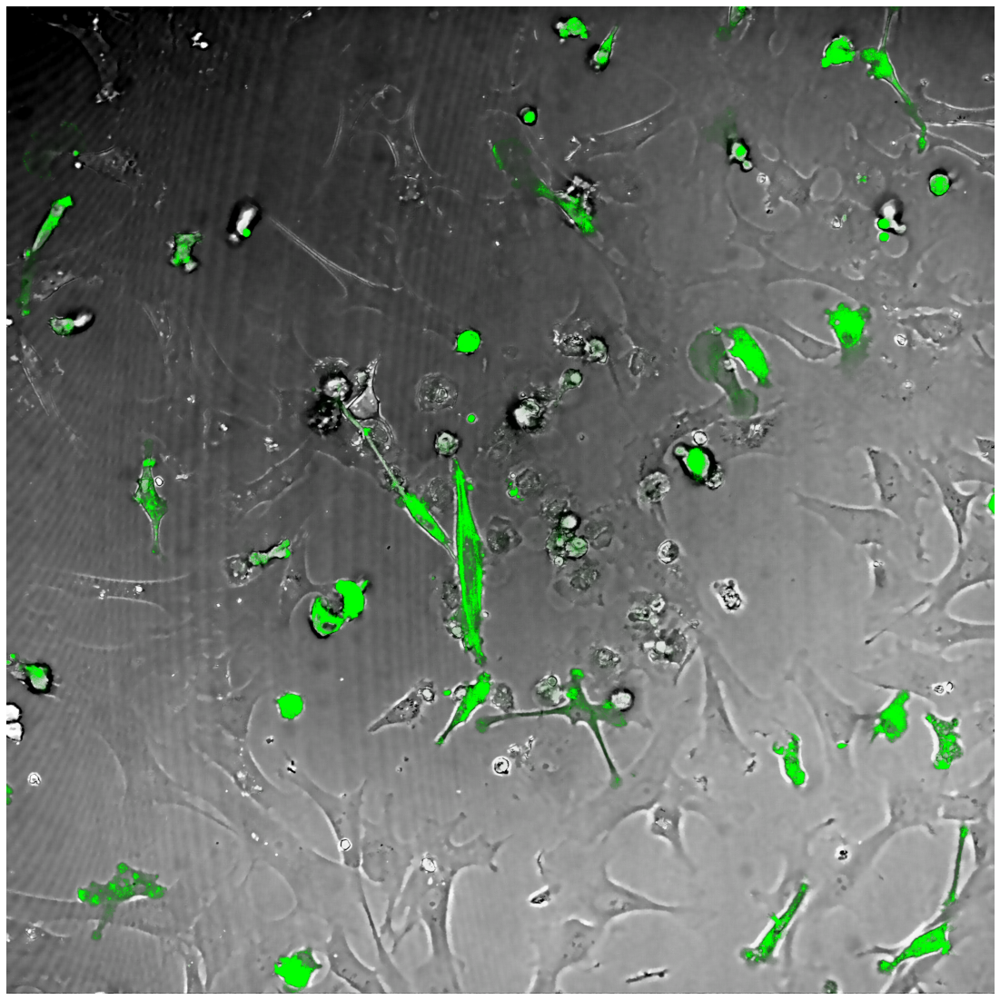

In [2]:
#first and last timepoint
data_path = data_path6
metadf = modules.get_metadata(data_path + 'raw')
np.unique(metadf['timepoint'])

metadf = modules.get_metadata(data_path + 'denoised/')
well = 5
#for well in np.unique(metadf['well_id'])[1:]:
for i in np.array([1,30]):
    filename = metadf[(metadf['timepoint'] == i) & (metadf['well_id'] == well)& (metadf['channel'] == 1)]['file'].values[0]
    filename2 = metadf[(metadf['timepoint'] == i) & (metadf['well_id'] == well)& (metadf['channel'] == 2)]['file'].values[0]
    img1 = io.imread(data_path + 'denoised/' + filename2)
    img2 = io.imread(data_path + 'denoised/' + filename)
    stack1 = np.dstack([modules.scale_image(img1,1)/65535,modules.scale_image(img1,1)/65535,modules.scale_image(img1,1)/65535])
    stack2 = np.dstack([np.zeros(img1.shape),modules.scale_image(img2,1)/65535,np.zeros(img1.shape),modules.scale_image(img2,1)/65535])
    plt.figure(figsize = (20,20))
    plt.imshow(stack1)
    plt.axis('off')
    plt.imshow(stack2)
    plt.axis('off')
    plt.savefig(data_path6 +'images/well_' + str(well)+ '_t_'+str(i) + '.png')
    plt.show()

In [3]:
#smfish
dir_stitched = data_path6 + 'raw4_smFISHs_C01/stitched/'
files = modules.sorted_nicely(os.listdir(dir_stitched))
file = files[0]
img = io.imread(dir_stitched + file)
img = img[::-1,::-1,:]

In [4]:
r = modules.scale_image(img[4000:8000,5500:9500,3],1)/65535
g = modules.scale_image(img[4000:8000,5500:9500,2],1)/65535
b = modules.scale_image(img[4000:8000,5500:9500,0],1)/65535
#b = np.zeros(img[6000:10000,5000:9000,3].shape)
stack = np.dstack([r,g,b])
stack = stack[1000:3850,400:3250]
stack2 = stack[700:1200,800:1300]

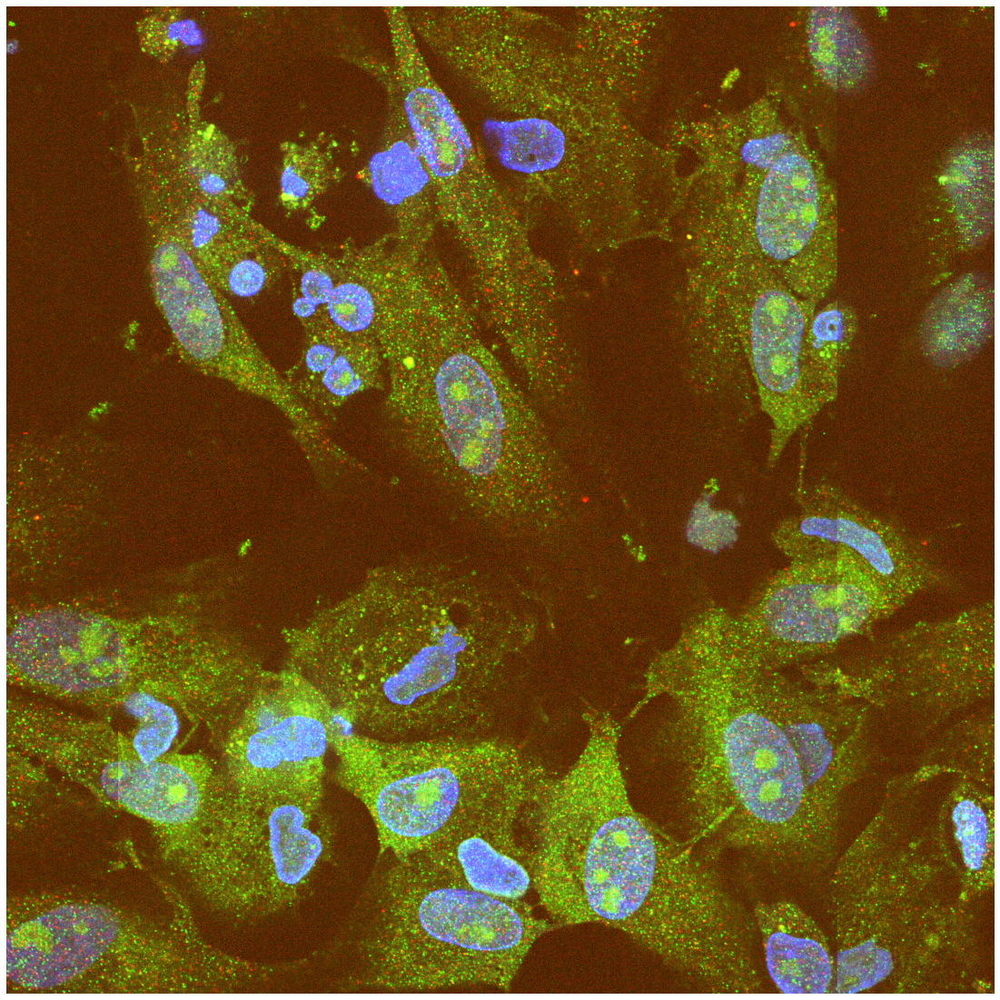

In [5]:
plt.figure(figsize = (20,20))
plt.imshow(stack)
plt.axis('off')
plt.show()

In [188]:
#smfish
dir_stitched = data_path6 + 'raw5_smFISH_bleached_C01/stitched/'
files = modules.sorted_nicely(os.listdir(dir_stitched))
file = files[4]
img = io.imread(dir_stitched + file)
img = img[::-1,::-1,:]

In [189]:
r = modules.scale_image(img[...,3],1)/65535
g = modules.scale_image(img[...,2],1)/65535
b = modules.scale_image(img[...,0],1)/65535
#b = np.zeros(img[6000:10000,5000:9000,3].shape)
stack = np.dstack([r,g,b])
stack = stack[6750:9550,5300:8100]
stack2 = stack[700:1200,750:1250]

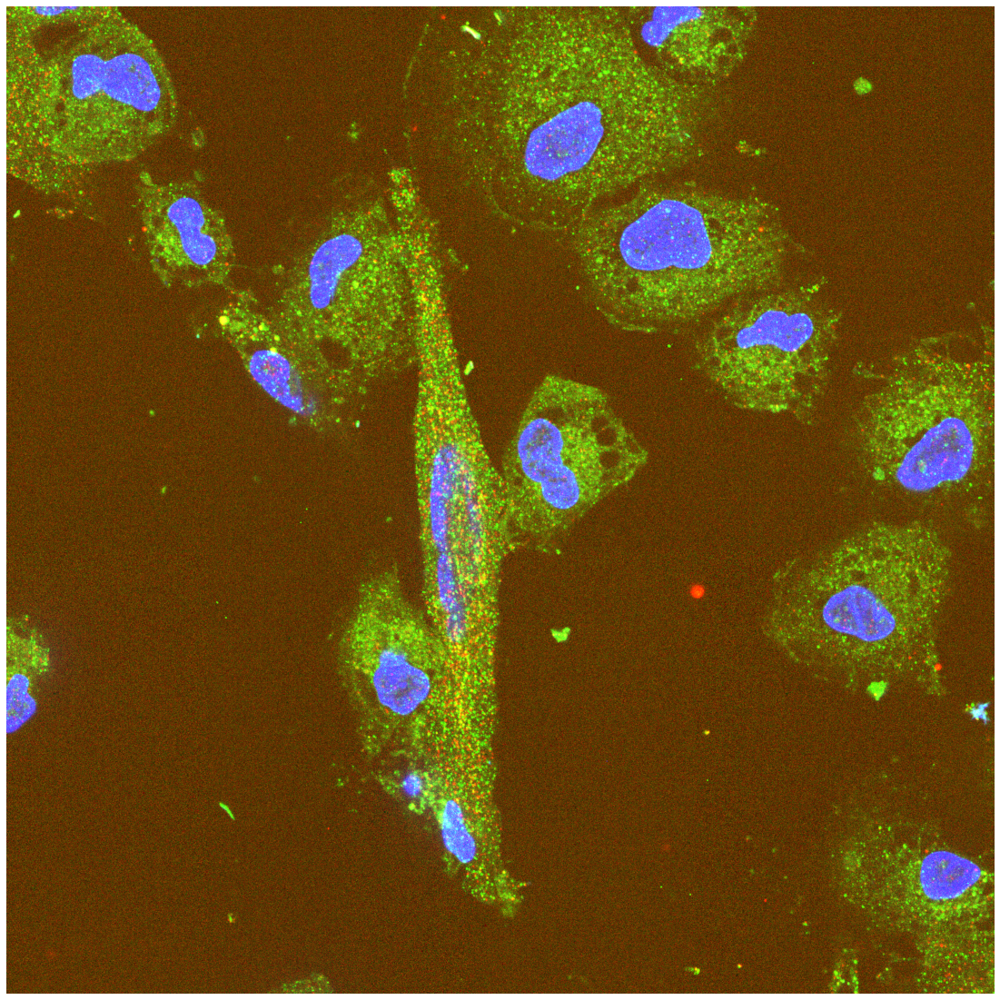

In [192]:
plt.figure(figsize = (20,20))
plt.imshow(stack)
plt.axis('off')
plt.show()

In [193]:
#smfish
dir_stitched = data_path6 + 'raw6_smfish_C02/stitched/'
files = modules.sorted_nicely(os.listdir(dir_stitched))
file = files[4]
img = io.imread(dir_stitched + file)
img = img[::-1,::-1,:]

In [195]:
r = modules.scale_image(img[...,3],1)/65535
g = modules.scale_image(img[...,2],1)/65535
b = modules.scale_image(img[...,0],1)/65535
#b = np.zeros(img[6000:10000,5000:9000,3].shape)
stack = np.dstack([r,g,b])
stack1 = stack[5900:8700,5800:8600]
#stack1 = stack[6750:9550,5300:8100]
stack2 = stack1[650:1150,750:1250]

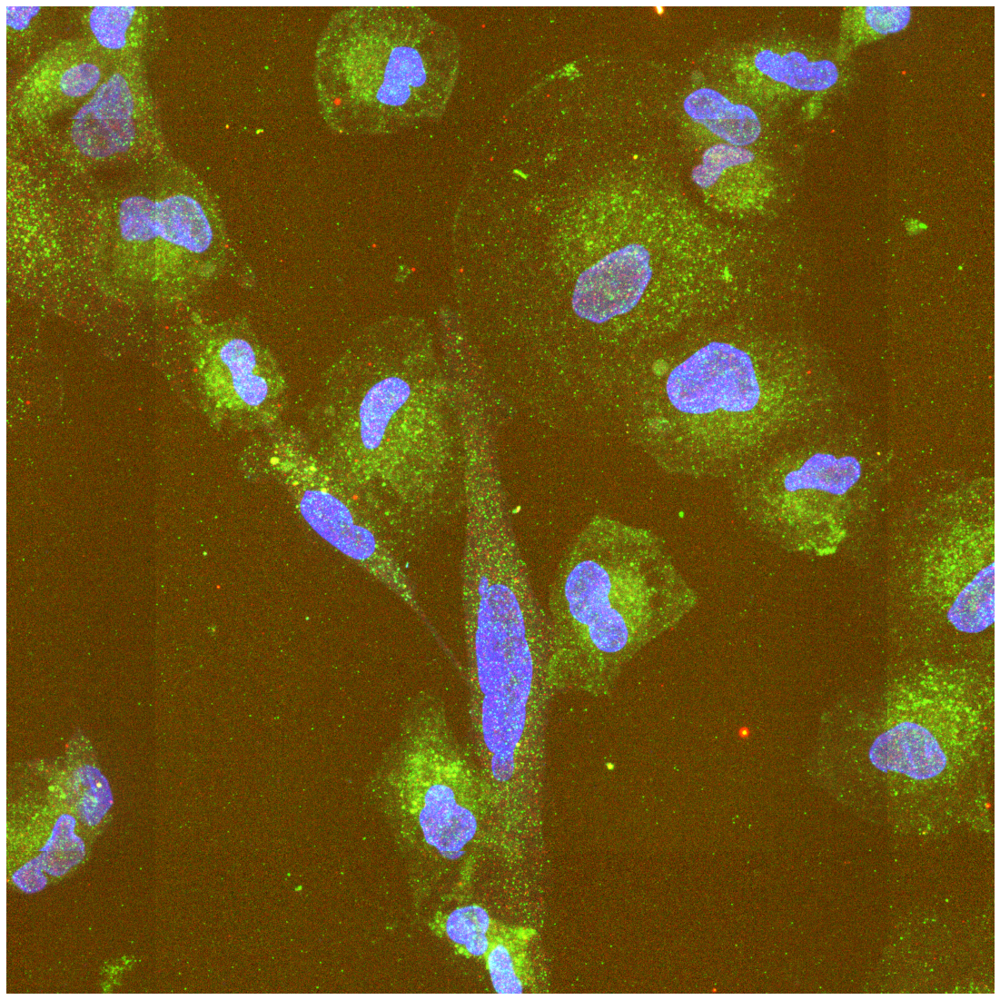

In [197]:
plt.figure(figsize = (20,20))
plt.imshow(stack1)
plt.axis('off')
plt.show()

In [ ]:
#smfish bleach 02?

In [3]:
#4i
dir_stitched = data_path6 + 'raw8_4i_C01/stitched/'
files = modules.sorted_nicely(os.listdir(dir_stitched))
file = files[1]
img = io.imread(dir_stitched + file)
img = img[::-1,::-1,:]

In [4]:
r = modules.scale_image(img[...,3],1)/65535
g = modules.scale_image(img[...,2],1)/65535
b = modules.scale_image(img[...,1],1)/65535
#b = np.zeros(img[6000:10000,5000:9000,3].shape)
stack = np.dstack([r,g,b])
stack1 = stack[11800:,3300:6100]
#stack1 = stack[6750:9550,5300:8100]

In [5]:
stack2 = stack1[800:1280,750:1250]
plt.figure(figsize = (20,20))
plt.imshow(modules.scale_image(stack2[5500:7000,:1000,3],0.1))
#plt.axis('off')
plt.show()

IndexError: index 3 is out of bounds for axis 2 with size 3

<Figure size 1440x1440 with 0 Axes>

In [82]:
dir_stitched = data_path6 + 'raw8_4i_C01/stitched/'
files = modules.sorted_nicely(os.listdir(dir_stitched))
file = files[1]
img2 = io.imread(dir_stitched + file)
img2 = img2[::-1,::-1,:]

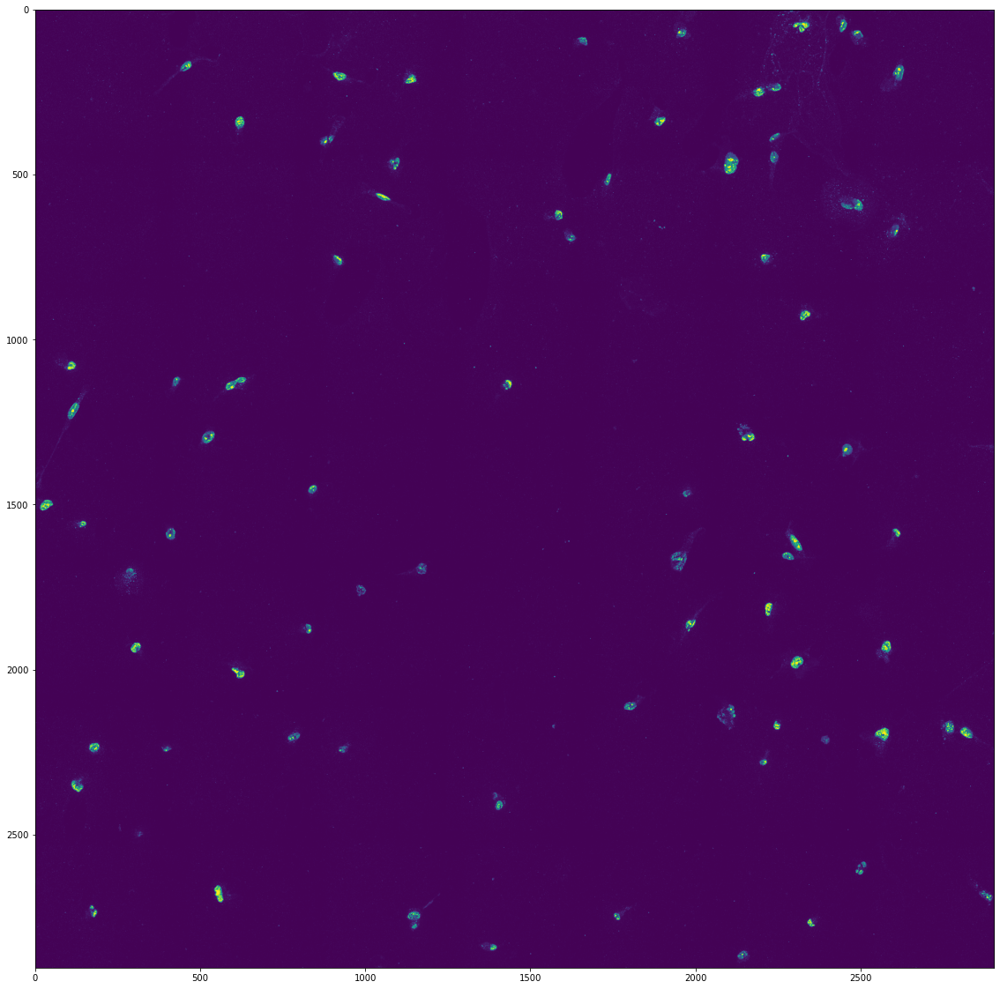

In [83]:
plt.figure(figsize = (20,20))
plt.imshow(modules.scale_image(img2[::5,::5,1],0.1))
#plt.axis('off')
plt.show()